# Unsupervised Learning to Investigate Circadian Rhythm in the Brain

![Paul Klee mice](Paul_Klee_mice.png)

## Intended Learning Outcomes

1. Revision of unsupervised learning; $k$-means clustering
2. Familiarity with time series and image data processing
3. Use of $k$-means and time series $k$-means clustering
4. Use of silhouette plots and elbow plots

# Introduction

## Context

All animals have internal genetic clocks which allow them to align their waking, sleeping and eating cycles with the day/night cycle on Earth. 
This is called the **circadian rhythm**. 

#### An Aside About the Circadian Rhythm

The circadian rhythm is responsible for waking and sleeping and is aligned by viewing blue/white light in the mornings. 
Blue/white light in the evenings interferes with this process and has been implicated in causing disease and disrupting mood in people with some mental health issues. 
So, avoid blue/white light in the evenings by using eye-safe mode on electronic devices (or orange-tinted glasses), getting good curtains, and not looking at your mobile phone before bed. 
Jet lag is the experience of a person's internal clock not matching the day/night schedule. 
To ease it, use bright light in the morning. 
An experiment in humans to see what the circadian rhythm is without the reset of daily light was undertaken, and it was found to be on a 28-hour cycle, which is shortened and adjusted by exposure to light. 
Circadian comes from the Latin *circa diem* or 'about daily'.

### The Experiment

Data has been generated for this "experiment" using a transgenic mouse. 
This mouse has had a gene for a fluorescent protein inserted next to the 'Period1' gene, which is known to control the circadian rhythm. 
Thus, when the neurons express the Period1 gene, the cell fluorescence can be seen under a microscope. 
Visual light microscope images were not included, so we assume each pixel comes from either a neuron or a small group of neurons in the hypothalamus. 
It is known that the neurons in the brain form a neural network, with different areas controlling different parts of the animal and its behaviour. 
These areas spike in sync and pass messages between each other. 
These living neural networks inspire software-based neural network models, which have now become a standard machine learning algorithm. 
We will play with the algorithmic version later in this course.

### Unsupervised learning

This is a typical unsupervised learning task. 
We do not have a ground truth. 
Instead, we will investigate the dataset and see what we can find. 
Our task is to find evidence for the circadian rhythm in the mouse brain and investigate where the neurons associated with it are. 

### The Data Owner's Description of the Dataset

#### Overview 

The data are a time series of fluorescence images measured at the OHSU Lab of Charles Allen. 
For background information, see this short YouTube video: [https://www.youtube.com/watch?v=rDbIOri8d60]. If you're interested in understanding more about biology, see [https://www.youtube.com/watch?v=P8js6di8Leg].

A fluorescent protein is a reporter for the circadian clock gene Period1. 
The expression of this gene has been followed in many neurons for several days to understand how the neural network in the suprachiasmatic nucleus (SCN) synchronises the circadian clock of individual neurons to produce a precise circadian rhythm. 
Each image is analysed to determine the fluorescence intensity of each neuron over multiple circadian cycles. 

#### FAQs

- How were the images obtained: which animal and how was a signal indicated?: 
  The images were taken from a trangenic mouse in which the promoter for the circadian clock gene Period1 drives the expression of the fluorescent protein Venus. 
- What is the "anatomy" of the images, and how are they oriented?: 
  The bright line is the third ventricle, which resides on the brain's midline. 
  The two bright regions on either side of the ventricle are the two portions of the suprachiasmatic nucleus (SCN). 
  Below the ventricle and the SCN is a dark horizontal band that represents the optic chasm. 
- What is the bright vertical line in the top middle?: 
  The bright line is the third ventricle. 
  Pericytes (a type of cell) that line the ventricle express the Venus at very high levels. 
  We don't know the function of the circadian clock in these cells. 

#### Challenge 

Currently, each experiment must be analysed by hand, following an individual experiment across a couple hundred images, which can take several days. 
This problem will become worse when an automated microscope stage is installed; this stage allows four SCN to be imaged simultaneously. 

#### Mouse Brain 

The brain is divided into regions that are specialised for different tasks. 
The Allen Mouse Brain Atlas was built by investigating genetic links and neuron-firing behaviour. 
The images look at the SCN at the bottom of the hypothalamus. 
The diagrams below of a mouse brain are included for interest (a detailed understanding of mouse neuroanatomy is not required to investigate the data).

<img src="./Allen_mouse_brain_atlas.jpg" width=29%>
<img src="./mouse_brain_2.jpg" width=59%>

## Instructions

Work through this workbook, answer the questions as you go (in pairs/groups as necessary) and complete the tasks. 

## Contents 

- Introduction
- Section 1: Data Loading, Cleaning, and Inspection
- Section 2: 2-Means Clustering
- Section 3: Analysing Periodic Signals using Fast Fourier Transform (FFT)
- **Task 1**: $k$-means for the First Dataset with Six Clusters
- Section 4: Finding the "best" value for $k$
- **Task 2**: Plot the Elbow Plot
- **Task 3**: Investigation of "Best" Number of Clusters
- Section 4: Time-Dependent $k$-means
- **Task 4**: $2$-means Clustering for the SCN and the ventricle
- Post Work

Throughout this workbook, there are short "Questions". 
These aim to ensure that you understand the data and consider the broader scientific context of your investigations. 

#### Question

Mice are often used as animal models for humans; thinking about the experiment, what you know about mice and what is discussed above, what might researchers need to consider when cross-applying results from mice to humans?

##### Answer in the Markdown Cell Below

Add your answer here!

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

## Section 1: Data Loading, Cleaning and Inspection

The data is stored as a pair of NumPy files (with the extension, `.npz`).
The data are greyscale images (i.e., a set of pixels with a brightness value; this can be stored as a NumPy array). 
We can read one of the files as follows,

In [2]:
image_1 = np.load('flo_image_1.npz')
print(image_1.keys())

KeysView(NpzFile 'flo_image_1.npz' with keys: image_ids, image_stack)


NumPy files are read in as objects similar to dictionaries. 
We can see the keys of this object above: `image_ids` and `image_stack`. 
We will turn this into a Python dictionary, where the keys are the individual `image_ids`, and the values are each image.
Note that at this stage, we reduce the resolution of the images by a factor of eight, using list indexing. 

In [3]:
DOWNSAMPLE_VALUE = 4

image_dict_1 = dict(zip(image_1['image_ids'], 
                        image_1['image_stack'][:, ::DOWNSAMPLE_VALUE, ::DOWNSAMPLE_VALUE]))

We then do the same for the other file and [merge two dictionaries](https://stackoverflow.com/questions/38987/how-do-i-merge-two-dictionaries-in-a-single-expression-in-python).

In [4]:
image_2 = np.load('flo_image_2.npz')
image_dict_2 = dict(zip(image_2['image_ids'], 
                        image_2['image_stack'][:, ::DOWNSAMPLE_VALUE, ::DOWNSAMPLE_VALUE]))

image_dict = image_dict_1 | image_dict_2

We can see that the length of the merged dictionary is twice that of the individual one. 

In [5]:
len(image_dict), len(image_dict_1)

(1600, 800)

In addition to the data, there is a `.csv` file that has temporal information about the collected data. 
This will be used to determine when a particular image was taken. 

In [6]:
time_df = pd.read_csv('Circadian_rhythm.csv')

To make this data readily accessible, the following additional `pd.Series` have been added to the `pd.DataFrame`. 
Compare the keys in the `image_dict` object to determine what the data cleaning below is achieving. 

In [7]:
time_df['path'] = [f'141110A3.{i:04d}' for i in time_df['Image.No.']]
time_df['loaded'] = [i in image_dict.keys() for i in time_df['path']]

It is then possible to [query the `pd.DataFrame`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html) to obtain `pd.DataFrame` objects containing only information that is present in `image_dict``.

In [8]:
loaded_time_df = time_df.query('loaded')

`pd.DataFrame` objects include nice convenience functions such as `sample`. 

In [9]:
loaded_time_df.sample(3)

,Image.No.,Frame.No,Time.hrs.,path,loaded
1427,1477,1428,146.316306,141110A3.1477,True
379,429,380,41.516306,141110A3.0429,True
1468,1518,1469,150.416306,141110A3.1518,True


### Interrogate the Data

We can visualise some of these images. 

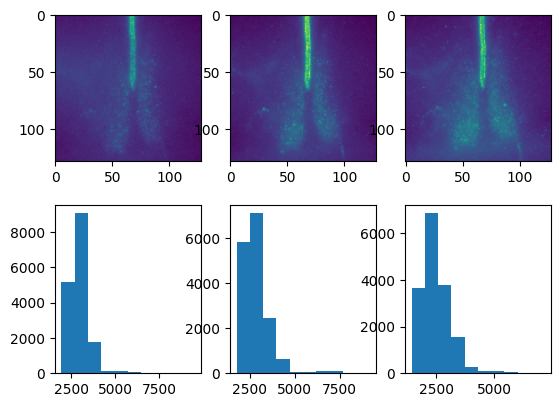

In [10]:
fig, axes = plt.subplots(2, 3)
for i, image in enumerate([image_dict[s] for s in loaded_time_df.sample(3)['path']]):
    axes[0, i].imshow(image)
    axes[1, i].hist(image.ravel())
plt.show()

Below, we assemble the data into 3D stacks, ordered by time for further analysis. 

In [11]:
ordered_im_stack = np.stack([image_dict[i] for i in loaded_time_df.sort_values('Time.hrs.')['path'].values], 0)

This results in a stack with 800 images, each with 128 x 128 pixels. 

In [12]:
ordered_im_stack.shape

(1600, 128, 128)

From this, it is possible to plot a montage of the images arranged by time. 

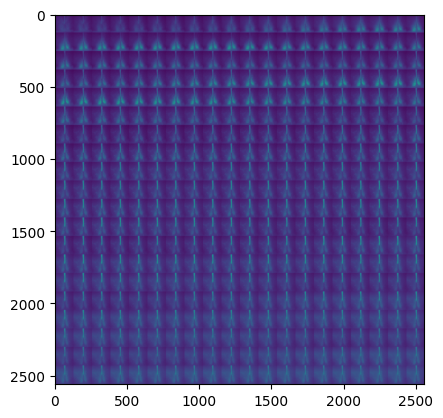

In [13]:
from skimage.util import montage

fig, ax = plt.subplots()
ax.imshow(montage(ordered_im_stack[::4]))
plt.show()

Alternatively, we can use `matplotlib` to create an animation. 

In [14]:
import matplotlib.animation

plt.rcParams["animation.html"] = "jshtml"
plt.ioff()

fig, ax = plt.subplots(1,1)
images = [x for x in ordered_im_stack][::16]

def animate(t):
    plt.cla()
    ax.imshow(images[t])

matplotlib.animation.FuncAnimation(fig, animate, frames=len(images))

#### Question

What does the data in the montage and animation show you? 

##### Answer in the Markdown Cell Below

Add your answer here!

In order to produce the animation, it was necessary to edit some `matplotlib` parameters, we undo that change with this cell. 

In [15]:
# undo the changes we did to show the animation above
plt.close(fig)
plt.rcParams["animation.html"] = 'none'
plt.ion()

### Time series data

The data we want to cluster is in the time series of the individual pixel's variation in brightness. 
We must reshape each image from a two-dimensional 128 x 128 image to a one-dimensional 16384 (128 x 128 = 16384) long vector. 

In [16]:
time_vec = ordered_im_stack.reshape(ordered_im_stack.shape[0], -1)

The above gives our vectors the dimensions of `n_times` by `n_pixels`. 

In [17]:
time_vec.shape

(1600, 16384)

We can plot the different times as different lines as shown below. 

Text(0, 0.5, 'Brightness')

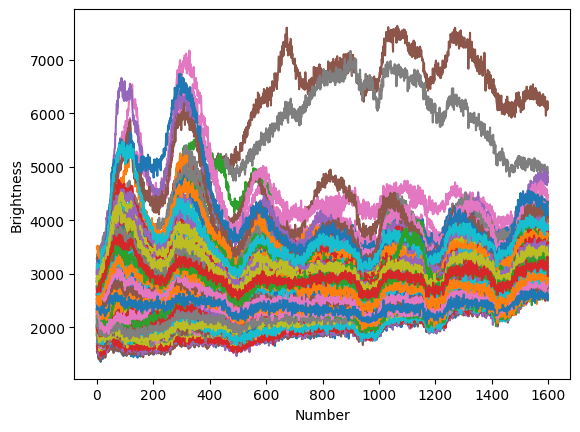

In [18]:
fig, ax = plt.subplots()
ax.plot(time_vec[:,::100])
ax.set_xlabel('Number')
ax.set_ylabel('Brightness')

# Section 2: 2-Means Clustering

Previously, you have looked at $k$-means clustering of data. 
Remember: $k$ is the number of clusters; this works best for equally sized globular clusters and is available in the scikit-learn package. 

The number of observations is the pixel number; therefore, it is necessary to transpose the data so that this is the leading dimension. 
Previously, you may have identified clusters in two-dimensional space. 
We can think of this as identifying clusters in $n$-dimensional space, where $n$ is the number of timesteps. 

In [19]:
from sklearn.cluster import KMeans

k_means_2 = KMeans(n_clusters=2, n_init=10, random_state=0)
k_means_2.fit(time_vec.T)

KMeans(n_clusters=2, n_init=10, random_state=0)

It is then possible to visualise the clusters by predicting the cluster labels for each pixel (observation) and representing this as a colour map by reshaping these labels to the original 128 x 128.

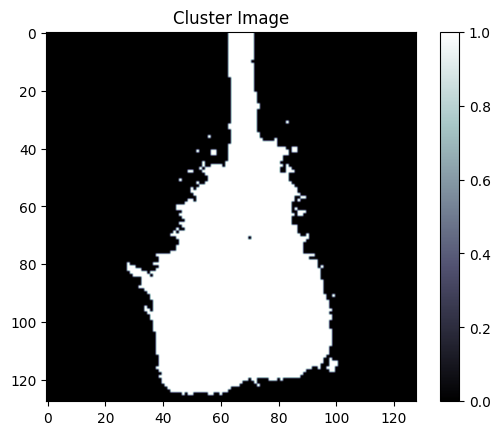

In [20]:
cluster_labels_2 = k_means_2.predict(time_vec.T)

cluster_img = cluster_labels_2.reshape(ordered_im_stack.shape[1:])

fig, ax = plt.subplots()
cmap = ax.imshow(cluster_img, cmap='bone')
ax.set_title('Cluster Image')
plt.colorbar(cmap, ax=ax)
plt.show()

The cluster that is lighting up, is cluster 1, while where it has not is cluster 0 (from the colour bar)
It is possible to observe each cluster's trend as a function of timestep. 

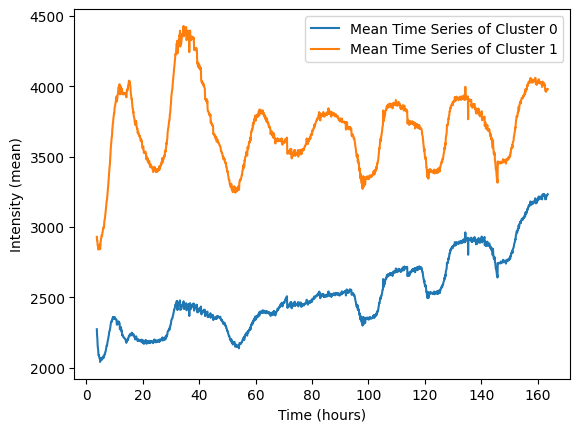

In [21]:
cluster_ids = np.unique(cluster_labels_2)

fig, ax = plt.subplots(1)
for i in cluster_ids:
    ax.plot(loaded_time_df['Time.hrs.'], 
            np.mean(time_vec[:, cluster_labels_2 == i], 1), 
            label='Mean Time Series of Cluster {}'.format(i))
    ax.set_xlabel('Time (hours)')
    ax.set_ylabel('Intensity (mean)')
ax.legend()
plt.show()

#### Question

Can you observe a periodic signal in this data? 
Which of the two signals appears more periodic, and which part of the dataset is this associated with?

#### Answer in the Markdown Cell Below

Add your answer here!

Assign the `periodic_cluster` value below with the cluster value that is more periodic. 

In [22]:
periodic_cluster = 1
periodic_data = np.mean(time_vec[:, cluster_labels_2 == periodic_cluster], 1)

The code below, will produce a plot, so that you can check you have the right cluster. 

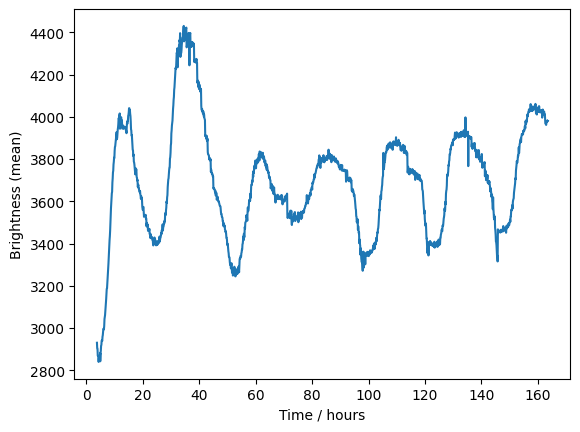

In [23]:
fig, ax = plt.subplots()
ax.plot(loaded_time_df['Time.hrs.'], periodic_data)
ax.set_xlabel('Time / hours')
ax.set_ylabel('Brightness (mean)')
plt.show()

## Section 3: Analysing Periodic Signals using Fast Fourier Transform (FFT)

A powerful tool to study periodic signals is a Fourier Transform. 
Fourier Transforms are used to convert between different domains, for example, from time (in units of seconds) to frequency (in units of per second). 
This may be familiar to those who have studied nuclear magnetic resonance (NMR) spectroscopy, where the instrument records a time series converted to the frequency domain to give the frequencies of excited nuclear particles. 

The Fourier Transform calculation involves the calculation of an integral (i.e., a summation of a large number of values), which can be slow to compute. 
The Fast Fourier Transform (FFT) is a popular algorithm for speeding up the computation of integrals and improving this scaling as a function of dataset size. 
FFTs are the backbone of many modern scientific approaches. 

If a signal is periodic in the time domain, this will appear as pears in the frequency domain. 
We harness the NumPy library, specifically the `fft` module, to access an FFT. 

In [24]:
spectrum = np.fft.rfft(periodic_data)

Above `rfft` stands for the [real Fast Fourier Transform](https://numpy.org/doc/stable/reference/generated/numpy.fft.rfft.html#numpy.fft.rfft). 

The `spectrum` gives only the intensity at each frequency. 
To compute the frequency values themselves, we used the [`rfftfreq` function](https://numpy.org/doc/stable/reference/generated/numpy.fft.rfftfreq.html). 
This function takes as input the length of the array that has been FFTed and the spacing between the time-domain data. 

In [25]:
spacing = np.diff(loaded_time_df['Time.hrs.']).mean()
frequency = np.fft.rfftfreq(periodic_data.size, d=spacing)

We can then plot these together to obtain the time between the peaks in the signal. 
To obtain the frequency in the time domain, we plot the reciprocal of the frequency. 
Note that we removed the very low-frequency data to clarify the plot. 

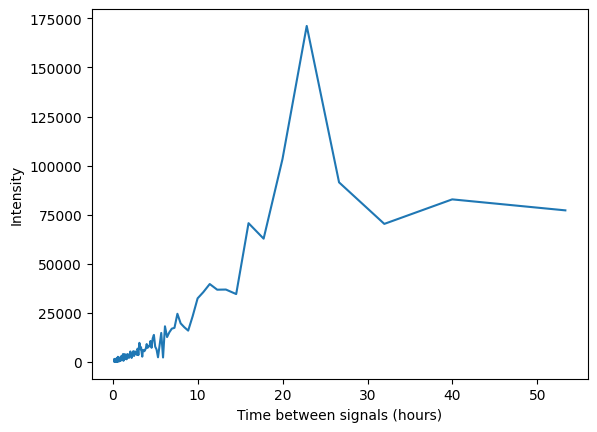

In [26]:
fig, ax = plt.subplots()
ax.plot(1.0 / frequency[3:], np.abs(spectrum[3:]))
ax.set_xlabel('Time between signals (hours)')
ax.set_ylabel('Intensity')
plt.show()

#### Question 

Is the signal periodic? 
If so, what is the time between the periodic signal (the wavelength of the signal)?
Why is this value observed?

#### Answer in the Markdown Cell Below

Add your answer here!

## Task 1: $k$-means for the First Dataset with Six Clusters

Repeat the $k$-means analysis for the time series data, using 6 clusters instead of 2. 
This is more compute-intensive, so we recommend that you run it on a smaller dataset, e.g., taking the first 800 timesteps from the data. 

In [27]:
X = time_vec[:800].T

Use the empty cells (and add more as necessary) below to:
- Perform the new $k$-means clustering
- Plot the cluster label colourmap image for the data with 6 clusters
- Plot the mean time series for each of the clusters.

Remember that you only use the first 800 samples, so it may be necessary to slice other arrays. 

In [28]:
### ANSWER

In [29]:
### ANSWER

In [30]:
### ANSWER

## Section 4: Finding the "best" value for $k$

The value of $k$ is a "hyperparameter" for our machine learning approach. 
This means that it is a parameter that we must optimize for our given data. 
We can use a few different plots and metrics to quantify which value of $k$ is "best. " 
Note that we use "best" in inverted commas because these metrics are imperfect, and we (as scientists) should always use our best judgment for the problem. 

First, we need to run the $k$-means cluster for a series of values of $k$. 
We will store each `KMeans` object in a list so we can use it later.

In [31]:
X = time_vec[:800].T

k_means_list = []
k_values = range(1, 10)

for n_clusters in k_values:
    k_means = KMeans(n_clusters=n_clusters, n_init=2, random_state=0)
    k_means.fit(X)
    k_means_list.append(k_means)

The first plot that we will consider is the [elbow plot](https://en.wikipedia.org/wiki/Elbow_method_(clustering)), which uses the inertia of the $k$-means. 
The inertia measures how well the dataset has been clustered into the $k$ clusters. 
It is the sum of the squared distances between each point and the center of the cluster to which it has been assigned.
We can get the inertia from the `inertia_` property of the `KMeans` object. 

In [32]:
k_means_list[-1].inertia_

624967703634.3794

## Task 2: Plot the Elbow Plot

Create a plot of the number of $k$-clusters against the inertia of each clustering. 
We interpret this plot by identifying the "elbow" in the graph; the location of this elbow is the "best" number of clusters. 
This elbow indicates where there are diminishing returns on decreasing the inertia with respect to increasing the number of clusters. 

In [33]:
### ANSWER

The elbow plot is not a perfect way to determine the best value for $k$. 
Therefore, we often use it with other metrics, such as the silhouette score. 

The silhouette score for a given sample $i$ is determined using the following equation, 
$$
s_i = \frac{b_i - a_i}{\mathrm{Max[a_i, b_i]}}
$$
where,
- $a_i$ is the average distance between point $i$ and all other points in the cluster that $i$ has been assigned to, 
- $b_i$ is the minimum average distance from $i$ to all clusters to which $i$ does not belong. 

The value of $s_i$ can be interpreted as:
-  $s_i = +1$ indicates that the sample is far from the neighbouring clusters.
-  $s_i = 0$ indicates that the sample is on or very close to the decision boundary between two neighbouring clusters.
-  $s_i < 0$ indicates that those samples might have been assigned to the wrong cluster or are outliers.

We can determine the average silhouette using the `silhouette_score` function from the `sklearn.metrics` module. 
Note that it is not possible to compute the silhouette score for a $k$-means with a single cluster. 

In [34]:
from sklearn.metrics import silhouette_score

avg_silhouette_score = [silhouette_score(X, k.predict(X)) for k in k_means_list[1:]]

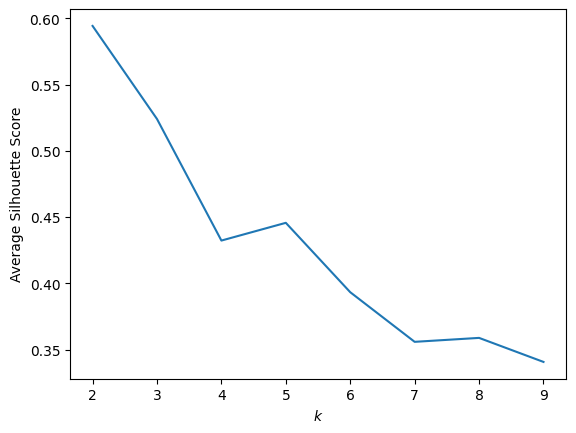

In [35]:
fig, ax = plt.subplots()
ax.plot(k_values[1:], avg_silhouette_score)
ax.set_xlabel('$k$')
ax.set_ylabel('Average Silhouette Score')
plt.show()

The "best" value of $k$ is indicated with a peak in the silhouette score.
If this plot has more than one peak, this may be indicative that the data might be best represented as being clustered into clusters and subclusters. 
A dataset like this would also be a good candidate for a different type of clustering algorithm: hierarchical clustering.

#### Question

From the elbow plot and silhouette score plot, what do you think the "best" value for $k$ is for this data?
Consider again the context of this finding with respect to the nature of the data we are investigating (i.e., locations of pixels in mice brains). 

#### Answer in the Markdown Cell Below

Add your answer here!

## Task 3: Investigation of "Best" Number of Clusters

The plots above indicate that $k=5$ represents the "best" number of clusters. 
Let's look in more detail at the results for this $k$-means clustering. 

In [36]:
k_means_5 = k_means_list[4]

Similar to the previous task with $k=6$, perform the following:
- Plot the cluster label colourmap image for the data with 6 clusters
- Plot the mean time series for each of the clusters

In [37]:
### ANSWER

In [38]:
### ANSWER

This data shows that the two inner clusters (clusters 0 and 4) show a periodic signal (this can be quantified with the FFT approach above). 
Cluster 4 is the SCN that the data owners identified above. 
Clusters 1 and 2 are the outer parts of the brain, which show a less strong periodic signal. 
Cluster 3 shows different behaviour; this is the ventricle. 
Remember that the data owners identified that they did not know why the ventricle responded this way. 
There appears to be a linear increase in the brightness that overpowers any periodic signal.

## Section 4: Time-dependent $k$-means

So far, we have used $k$-means clustering to identify different parts of the mouse brain. 
Now, we will investigate clusters in our data within the time series of a specific part. 
This will use a methodology called time-dependent $k$-means clustering. 
For this, we will use a new library called `tslearn`. 

In [39]:
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesResampler

/Users/ee23687/miniforge3/envs/intensive/lib/python3.10/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


First, we will generate a `time_vec` object containing only time series information from the cluster we initially investigated with the FFT (the mouse brain region).
Therefore, we use the variable `periodic_cluster` again. 

In [40]:
brain_X = time_vec[:800, cluster_labels_2 == periodic_cluster].T

We can see how many samples/observations we have in this new dataset.

In [41]:
brain_X.shape

(4397, 800)

There are 4397 samples, each of which has 1600 points. 
We can plot a subset of these samples; here, we use the `alpha` parameter to decrease the opacity of the line. 

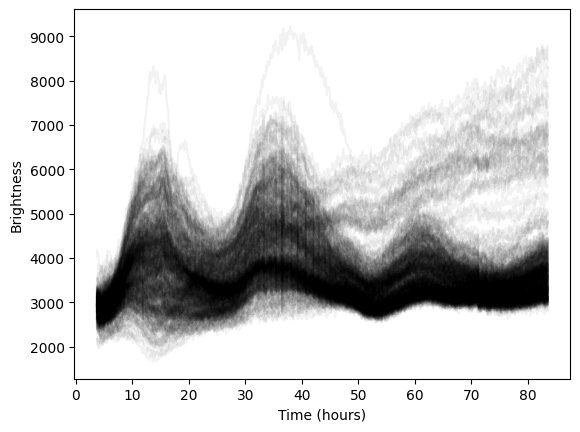

In [42]:
fig, ax = plt.subplots()
for i in brain_X[::10]:
    ax.plot(loaded_time_df['Time.hrs.'][:800], i, 'k-', alpha=0.05);
ax.set_xlabel('Time (hours)')
ax.set_ylabel('Brightness')
plt.show()

For efficiency, we will reduce the number of observations we will use in the time series $k$-means. 
Let's use 275 samples from the dataset (we obtain this using the [`array_split`](https://numpy.org/doc/stable/reference/generated/numpy.array_split.html) function, take a look at the documentation to determine the utility).

In [43]:
brain_X = np.array_split(brain_X, 16)[8]
brain_X.shape

(275, 800)

Before performing $k$-means on this data, we must scale the data by the variance present. 
This ensures that only variation (and not magnitude) is included in our $k$-means model. 
We achieve this with the `TimeSeriesScalerMeanVariance().fit_transform` function.

In [44]:
brain_X = TimeSeriesScalerMeanVariance().fit_transform(brain_X)

We can also smooth the data at this stage using the `TimeSeriesResampler` object. 
Below, we reduce the data size to provide samples each hour.   

In [45]:
brain_X = TimeSeriesResampler(sz=80).fit_transform(brain_X)

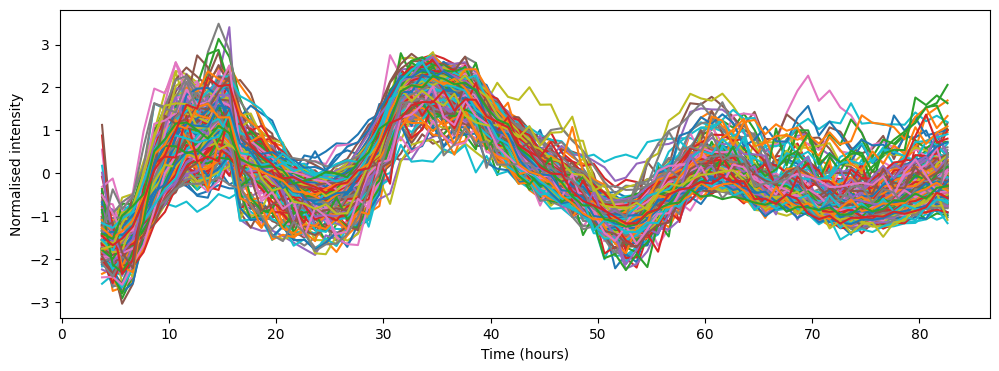

In [46]:
fig, ax = plt.subplots(figsize=(12, 4))
for i in range(1,len(brain_X)):
    ax.plot(loaded_time_df['Time.hrs.'][:800:10], brain_X[i]);
ax.set_xlabel('Time (hours)')
ax.set_ylabel('Normalised intensity')
plt.show()

We can perform time-series $k$-means clustering in the same way as using `sklearn` using the `TimeSeriesKMeans` class from `tslearn`.
Below, we show this for 2 clusters. 

In [47]:
tskm = TimeSeriesKMeans(n_clusters=2, random_state=0, metric='dtw')
cluster_labels = tskm.fit_predict(brain_X)

Recall, that the `fit_predict` method will simply run the `fit` method with the input data followed by the `predict` method to return the cluster labels. 

We can then visualise these clusters. 

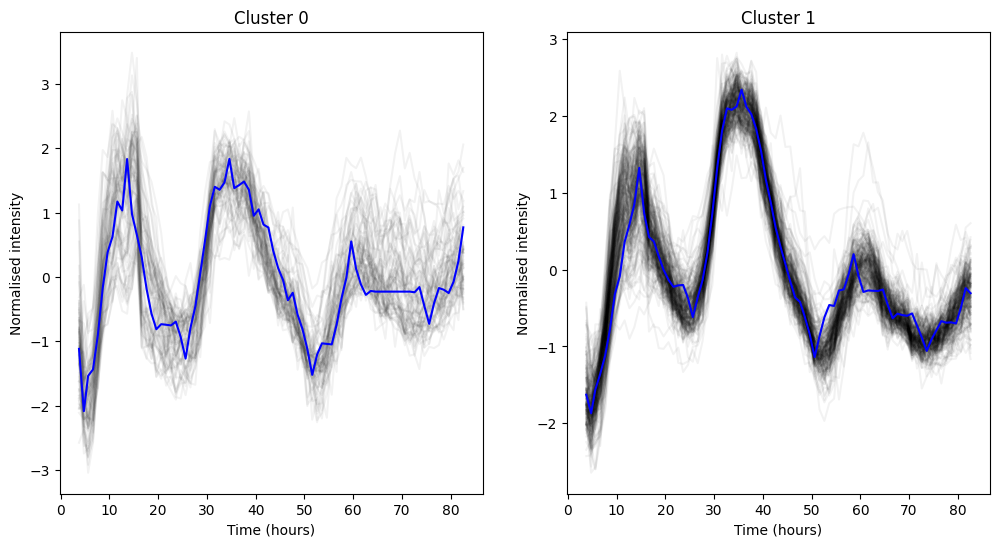

In [48]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
for i in range(2):
    ax[i].plot(loaded_time_df['Time.hrs.'][:800:10],
               brain_X[cluster_labels==i][:, :, 0].T, 
               'k-', alpha=0.05)
    ax[i].plot(loaded_time_df['Time.hrs.'][:800:10], 
               tskm.cluster_centers_[i], 'b-')
    ax[i].set_xlabel('Time (hours)')
    ax[i].set_ylabel('Normalised intensity')
    ax[i].set_title(f'Cluster {i}')
plt.show()

#### Question

Above, we fit $k=2$-means for the time series data. 
Looking at the cluster 1 plot, do you think that $k=3$ would offer a better explanation and why?

#### Answer in the Markdown Cell Below

Add your answer here!

## Task 4: $2$-means Clustering for the SCN and the ventricle

Cluster, using $k=2$, the data from the SCN and the ventricle region in the same way as the above has been performed.
Comment on the difference between the two clusters for each analysis area.  

In [49]:
### ANSWER

## Post Work

Previously, it was mentioned that cluster 3 in the mouse brain identification section has a linear increase in brightness with time. 
It may be desirable to remove this linear increase trend. 
Consider what you subtract such a linear trend from the data. 
Code up an implementation and share it with a colleague for feedback. 